<a href="https://colab.research.google.com/github/wpqc21/VulNeuralNetworks/blob/main/Random_Walk_TensorFlow_01_26_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
def map_function(x, lower_bound, upper_bound):
   return (x - lower_bound) % (upper_bound - lower_bound)

In [2]:
def force_mov(x, y, dxy, mag):
    x = int(x)
    y = int(y)
    force_xy = dxy[x][y]
    return mag * (force_xy)
    
    

In [3]:
import numpy as np
import pandas as pd
from pylab import *
import plotly.graph_objects as go
import plotly.express as px
import random
from random import randint
import matplotlib.pyplot as plt
import pylab
import math
import statistics
from plotly.subplots import make_subplots
import cv2 as cv

np.set_printoptions(threshold=np.inf)

In [4]:
%matplotlib inline
import noise
import numpy as np
import matplotlib
from mpl_toolkits.mplot3d import axes3d

### Necessary Installations:

In [5]:
## For Plot/Subplot image exports:
# pip install opencv-python

## For saving image of plotly.express plots:
# pip install kaleido

#### 04/27/2022

# Random Walks

In [6]:
# Scale 2x the Shape
shape = (2000,2000)
scale = 4000.0
octaves = 6
persistence = 0.5
lacunarity = 2.0
seed = random.randint(0, 100)

In [7]:
world = np.zeros(shape)
for i in range(shape[0]):
    for j in range(shape[1]):
        world[i][j] = noise.pnoise2(i/scale, 
                                    j/scale, 
                                    octaves=octaves, 
                                    persistence=persistence, 
                                    lacunarity=lacunarity, 
                                    repeatx=1024, 
                                    repeaty=1024, 
                                    base=seed)

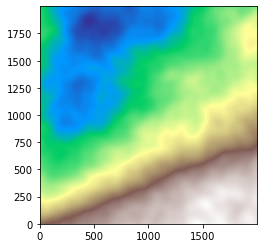

In [8]:
matplotlib.pyplot.imshow(world,cmap='terrain', origin='lower')

In [9]:
# Multiply by 1000 in order to scale correctly
world = world*1000

In [10]:
lin_x = np.linspace(0,1,shape[0],endpoint=False)
lin_y = np.linspace(0,1,shape[1],endpoint=False)
x,y = np.meshgrid(lin_x,lin_y)

#Elevation/Height = Z
Z = world

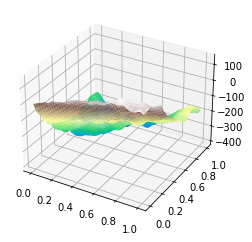

In [11]:
fig = matplotlib.pyplot.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(x,y,Z,cmap='terrain')

terrain_cmap = matplotlib.cm.get_cmap('terrain')
def matplotlib_to_plotly(cmap, pl_entries):
    h = 1.0/(pl_entries-1)
    pl_colorscale = []

    for k in range(pl_entries):
        C = list(map(np.uint8, np.array(cmap(k*h)[:3])*255))
        pl_colorscale.append([k*h, 'rgb'+str((C[0], C[1], C[2]))])

    return pl_colorscale

terrain = matplotlib_to_plotly(terrain_cmap, 255)


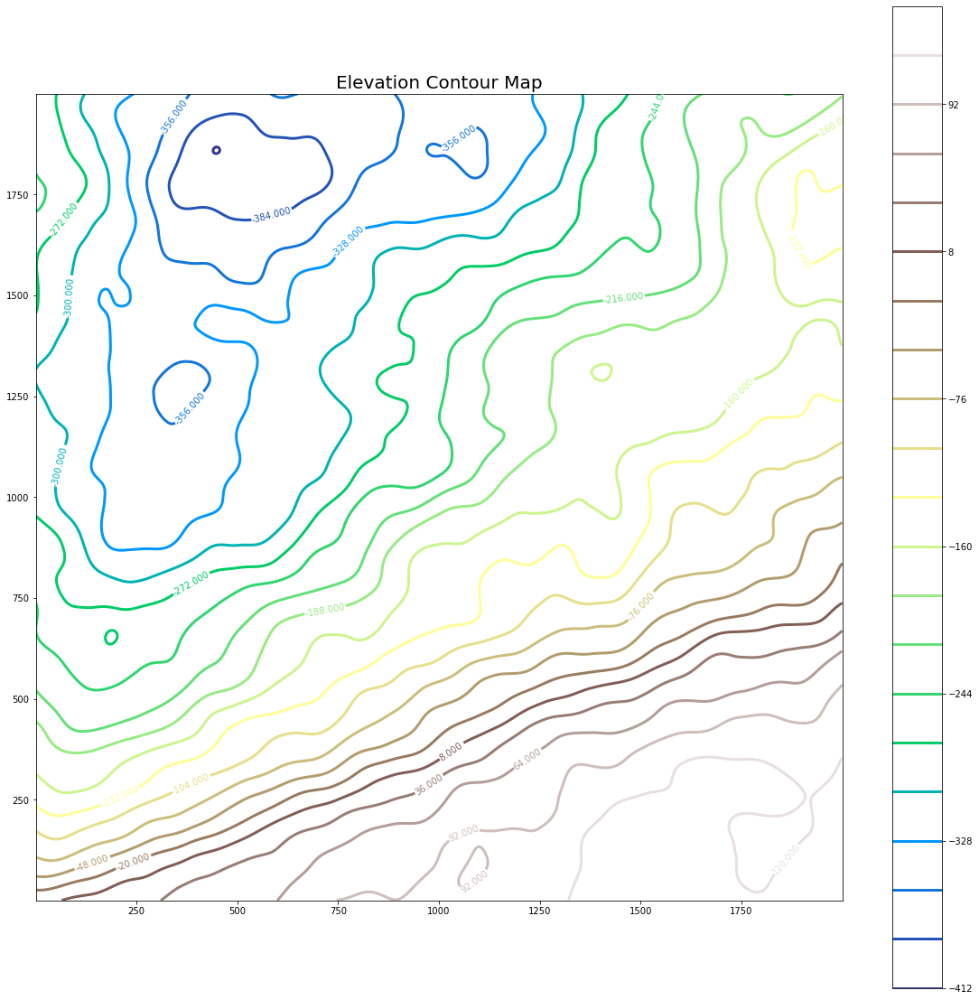

In [12]:
#Find Min, Max, Divide Absolute Value of Sum by 20

a = round(Z.min())

b = round(Z.max())

c = round((abs(Z.min()) + abs(Z.max())) / 20)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)
ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3,  origin='lower')
ax.clabel(ecm, fontsize=10)
plt.title("Elevation Contour Map", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

## 10 Steps, 9 Walkers, Force = 0.1

In [13]:
avg_steps = []

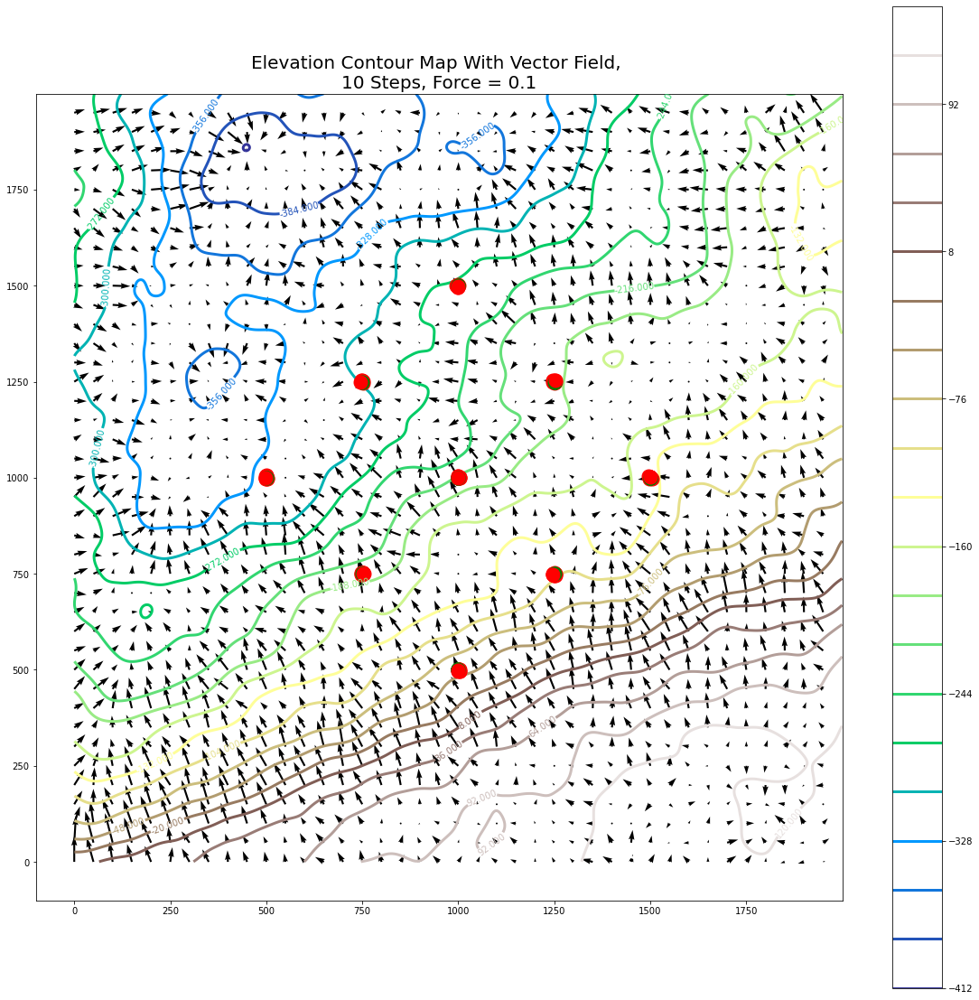

In [14]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

plt.title("Elevation Contour Map With Vector Field, \n10 Steps, Force = 0.1", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = {}
list_points = {}
list_dist = []

all_walks1 = []

A = 1999
N = 10
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

for m in range(10):

    for walker in range(W):
        if walker == 0:
            x[0] = 1000
            y[0] = 1000
        elif walker == 1:
            x[0] = 1000
            y[0] = 1500
        elif walker == 2:
            x[0] = 1000
            y[0] = 500
        elif walker == 3:
            x[0] = 500
            y[0] = 1000
        elif walker == 4:
            x[0] = 1500
            y[0] = 1000
        elif walker == 5:
            x[0] = 1250
            y[0] = 1250
        elif walker == 6:
            x[0] = 1250
            y[0] = 750
        elif walker == 7:
            x[0] = 750
            y[0] = 1250
        else:
            x[0] = 750
            y[0] = 750
        for i in range(1, N):
            rand = randint(0, 3)
            if rand == 0:
                x[i] = x[i - 1] + 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            elif rand == 1:
                x[i] = x[i - 1] - 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            elif rand == 2:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] + 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            else:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] - 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)
    

        if walker in list_origins:
            list_origins[walker].append((x[0], y[0]))
        else:
            list_origins[walker] = [(x[0], y[0])]
            
        if walker in list_points:
            list_points[walker].append((x[-1], y[-1]))
        else:
            list_points[walker] = [(x[-1], y[-1])]
        
        all_walks1.append((x, y))
        plt.plot(x,y)
        plt.plot(x[0], y[0], 'go', markersize=15)
        plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.savefig('force_10.png')
plt.show()

In [15]:
list_origins

{0: [(1000.0, 1000.0),
  (1000.0, 1000.0),
  (1000.0, 1000.0),
  (1000.0, 1000.0),
  (1000.0, 1000.0),
  (1000.0, 1000.0),
  (1000.0, 1000.0),
  (1000.0, 1000.0),
  (1000.0, 1000.0),
  (1000.0, 1000.0)],
 1: [(1000.0, 1500.0),
  (1000.0, 1500.0),
  (1000.0, 1500.0),
  (1000.0, 1500.0),
  (1000.0, 1500.0),
  (1000.0, 1500.0),
  (1000.0, 1500.0),
  (1000.0, 1500.0),
  (1000.0, 1500.0),
  (1000.0, 1500.0)],
 2: [(1000.0, 500.0),
  (1000.0, 500.0),
  (1000.0, 500.0),
  (1000.0, 500.0),
  (1000.0, 500.0),
  (1000.0, 500.0),
  (1000.0, 500.0),
  (1000.0, 500.0),
  (1000.0, 500.0),
  (1000.0, 500.0)],
 3: [(500.0, 1000.0),
  (500.0, 1000.0),
  (500.0, 1000.0),
  (500.0, 1000.0),
  (500.0, 1000.0),
  (500.0, 1000.0),
  (500.0, 1000.0),
  (500.0, 1000.0),
  (500.0, 1000.0),
  (500.0, 1000.0)],
 4: [(1500.0, 1000.0),
  (1500.0, 1000.0),
  (1500.0, 1000.0),
  (1500.0, 1000.0),
  (1500.0, 1000.0),
  (1500.0, 1000.0),
  (1500.0, 1000.0),
  (1500.0, 1000.0),
  (1500.0, 1000.0),
  (1500.0, 1000.0)],


In [16]:
list_points

{0: [(1003.6922634541988, 999.5406595766544),
  (999.692739546299, 1003.540766119957),
  (999.691928178072, 999.5405776202679),
  (1000.6922209858894, 1000.5407243967056),
  (1002.6924676001072, 1002.540716946125),
  (999.6922567486763, 1001.5411557853222),
  (998.691890925169, 998.5406200885773),
  (1002.6921956539154, 1000.5405947566032),
  (999.6933676302433, 1003.5409725010395),
  (999.6920265257359, 999.5410335958004)],
 1: [(997.6690236032009, 1498.951010197401),
  (999.6692270040512, 1498.9506630003452),
  (999.6695630252361, 1498.9508440494537),
  (1000.669436365366, 1499.950848519802),
  (999.6676981449127, 1496.9500915408134),
  (998.6688961982727, 1501.951420724392),
  (999.6688917279243, 1496.9509081244469),
  (994.668188393116, 1499.9517269432545),
  (995.6687054634094, 1500.9516561627388),
  (999.6693432331085, 1498.951234459877)],
 2: [(1002.88883882761, 496.00704675912857),
  (998.8883605003357, 500.00776797533035),
  (998.8880445957184, 498.0079184770584),
  (1001.8876

In [17]:
list_dist_10 = {}

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        list_dist_10[i] = []

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        d = math.dist(i, j)
        list_dist_10[i].append(d)

In [18]:
list_dist_10

{(1000.0, 1000.0): [3.720726144146007,
  3.5540728330527624,
  0.5531520319629926,
  0.8783807639619653,
  3.7019757397846207,
  1.5715810712041987,
  1.9598313900740163,
  2.745935201316286,
  3.554224199920508,
  0.5527185730860134],
 (1000.0, 1500.0): [2.5561358665749845,
  1.1002358445776133,
  1.0999621824670767,
  0.6712383446139395,
  3.0679579743393077,
  2.3621769989903827,
  3.0670171100600396,
  5.332030129257572,
  4.434609544794007,
  1.099655880555633],
 (1000.0, 500.0): [4.928393790647503,
  1.1116666400745516,
  2.2814104442551266,
  2.139953189900462,
  0.8880505194632743,
  4.907236904120345,
  4.144390945490472,
  2.195527257761454,
  2.8880354636486074,
  2.2810711187539763],
 (500.0, 1000.0): [4.452305642530413,
  3.299611142943651,
  2.6352224064020207,
  7.367571452951771,
  2.891167831267053,
  4.511210891815434,
  1.986164453886733,
  1.1897995529670438,
  0.6460019679838107,
  2.22324533479867],
 (1500.0, 1000.0): [2.4910634886633107,
  4.913852338396455,
  2.

In [19]:
avg_points = {}

In [20]:
avg_points_1 = []

for i in list_dist_10:
    avg_points[i] = []

for i in list_dist_10:
    print("The max distance of origin ", i, " : " , max(list_dist_10[i]))
    print("The min distance of origin ", i, " : " , min(list_dist_10[i]))
    print("The median distance of origin ", i, " : " , statistics.median(list_dist_10[i]))
    print("The average distance of origin ", i, " : " , mean(list_dist_10[i]))
    avg_points_1.append(mean(list_dist_10[i]))
    avg_points[i].append(mean(list_dist_10[i]))
    print("\n")

avg_steps.append(mean(avg_points_1))

The max distance of origin  (1000.0, 1000.0)  :  3.720726144146007
The min distance of origin  (1000.0, 1000.0)  :  0.5527185730860134
The median distance of origin  (1000.0, 1000.0)  :  2.3528832956951513
The average distance of origin  (1000.0, 1000.0)  :  2.2792597948509377


The max distance of origin  (1000.0, 1500.0)  :  5.332030129257572
The min distance of origin  (1000.0, 1500.0)  :  0.6712383446139395
The median distance of origin  (1000.0, 1500.0)  :  2.4591564327826836
The average distance of origin  (1000.0, 1500.0)  :  2.4791019876230562


The max distance of origin  (1000.0, 500.0)  :  4.928393790647503
The min distance of origin  (1000.0, 500.0)  :  0.8880505194632743
The median distance of origin  (1000.0, 500.0)  :  2.2812407815045512
The average distance of origin  (1000.0, 500.0)  :  2.7765736274115773


The max distance of origin  (500.0, 1000.0)  :  7.367571452951771
The min distance of origin  (500.0, 1000.0)  :  0.6460019679838107
The median distance of origin  

In [21]:
avg_points

{(1000.0, 1000.0): [2.2792597948509377],
 (1000.0, 1500.0): [2.4791019876230562],
 (1000.0, 500.0): [2.7765736274115773],
 (500.0, 1000.0): [3.12023006775466],
 (1500.0, 1000.0): [2.976578743831319],
 (1250.0, 1250.0): [3.1584311639273284],
 (1250.0, 750.0): [3.760796814795751],
 (750.0, 1250.0): [2.8433780624255047],
 (750.0, 750.0): [2.894230191482505]}

## 100 Steps, 9 Walkers, Force = 0.1

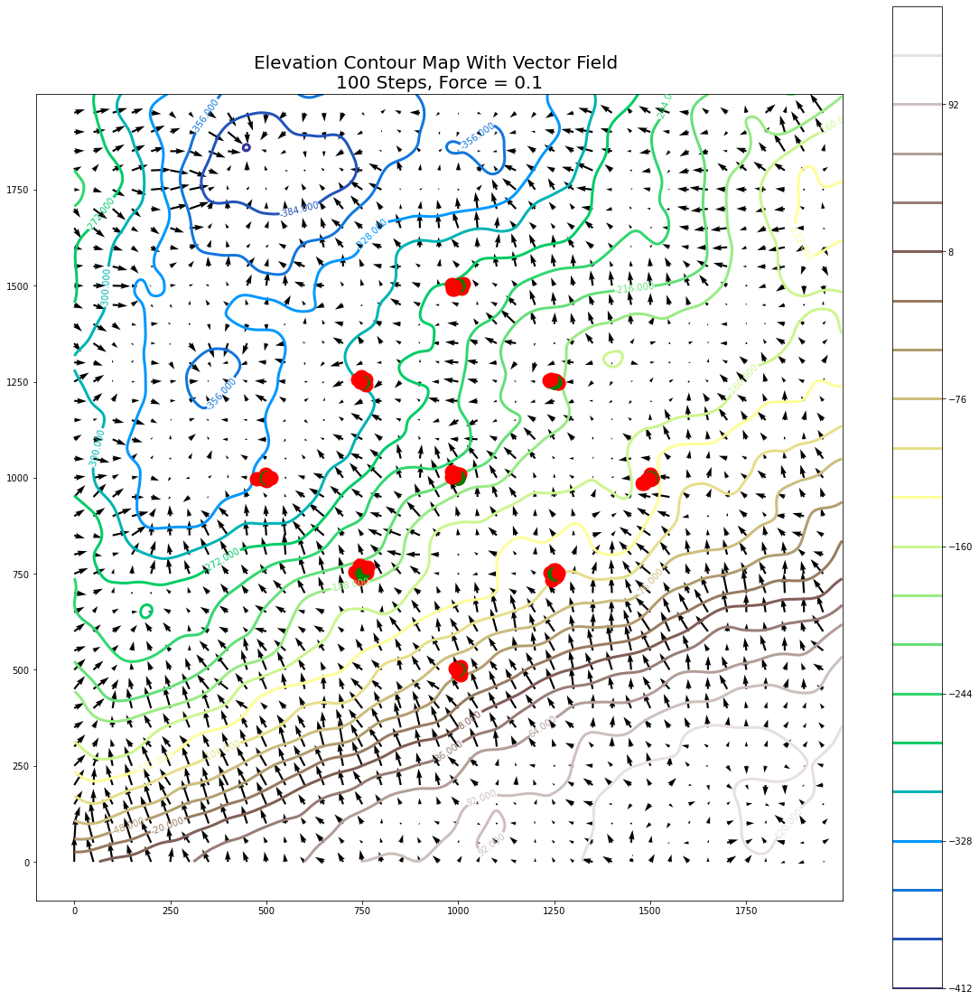

In [22]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

plt.title("Elevation Contour Map With Vector Field \n100 Steps, Force = 0.1", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = {}
list_points = {}
list_dist = []

all_walks1 = []

A = 1999
N = 100
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

for m in range(10):
    for walker in range(W):
        if walker == 0:
            x[0] = 1000
            y[0] = 1000
        elif walker == 1:
            x[0] = 1000
            y[0] = 1500
        elif walker == 2:
            x[0] = 1000
            y[0] = 500
        elif walker == 3:
            x[0] = 500
            y[0] = 1000
        elif walker == 4:
            x[0] = 1500
            y[0] = 1000
        elif walker == 5:
            x[0] = 1250
            y[0] = 1250
        elif walker == 6:
            x[0] = 1250
            y[0] = 750
        elif walker == 7:
            x[0] = 750
            y[0] = 1250
        else:
            x[0] = 750
            y[0] = 750
        for i in range(1, N):
            rand = randint(0, 3)
            if rand == 0:
                x[i] = x[i - 1] + 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            elif rand == 1:
                x[i] = x[i - 1] - 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            elif rand == 2:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] + 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            else:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] - 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)
    

        if walker in list_origins:
            list_origins[walker].append((x[0], y[0]))
        else:
            list_origins[walker] = [(x[0], y[0])]
            
        if walker in list_points:
            list_points[walker].append((x[-1], y[-1]))
        else:
            list_points[walker] = [(x[-1], y[-1])]
            
        all_walks1.append((x, y))
        plt.plot(x,y)
        plt.plot(x[0], y[0], 'go', markersize=15)
        plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.savefig('force_100.png')
plt.show()

In [23]:
list_dist_100 = {}

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        list_dist_100[i] = []

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        d = math.dist(i, j)
        list_dist_100[i].append(d)

In [24]:
avg_points_2 = []

for i in list_dist_100:
    print("The max distance of origin ", i, " : " , max(list_dist_100[i]))
    print("The min distance of origin ", i, " : " , min(list_dist_100[i]))
    print("The median distance of origin ", i, " : " , statistics.median(list_dist_100[i]))
    print("The average distance of origin ", i, " : " , mean(list_dist_100[i]))
    avg_points[i].append(mean(list_dist_100[i]))
    avg_points_2.append(mean(list_dist_100[i]))
    print("\n")

avg_steps.append(mean(avg_points_2))

The max distance of origin  (1000.0, 1000.0)  :  22.800942681735737
The min distance of origin  (1000.0, 1000.0)  :  0.3931623440989429
The median distance of origin  (1000.0, 1000.0)  :  11.492306745600224
The average distance of origin  (1000.0, 1000.0)  :  11.546217550126196


The max distance of origin  (1000.0, 1500.0)  :  17.837351735492316
The min distance of origin  (1000.0, 1500.0)  :  3.527002076520474
The median distance of origin  (1000.0, 1500.0)  :  11.116828517434161
The average distance of origin  (1000.0, 1500.0)  :  11.215903031801151


The max distance of origin  (1000.0, 500.0)  :  13.209106633026249
The min distance of origin  (1000.0, 500.0)  :  3.0469219598652315
The median distance of origin  (1000.0, 500.0)  :  6.790051148384701
The average distance of origin  (1000.0, 500.0)  :  6.971681063103452


The max distance of origin  (500.0, 1000.0)  :  24.547290641737376
The min distance of origin  (500.0, 1000.0)  :  4.222193795246257
The median distance of origin  

## 1,000 Steps, 9 Walkers, Force = 0.1

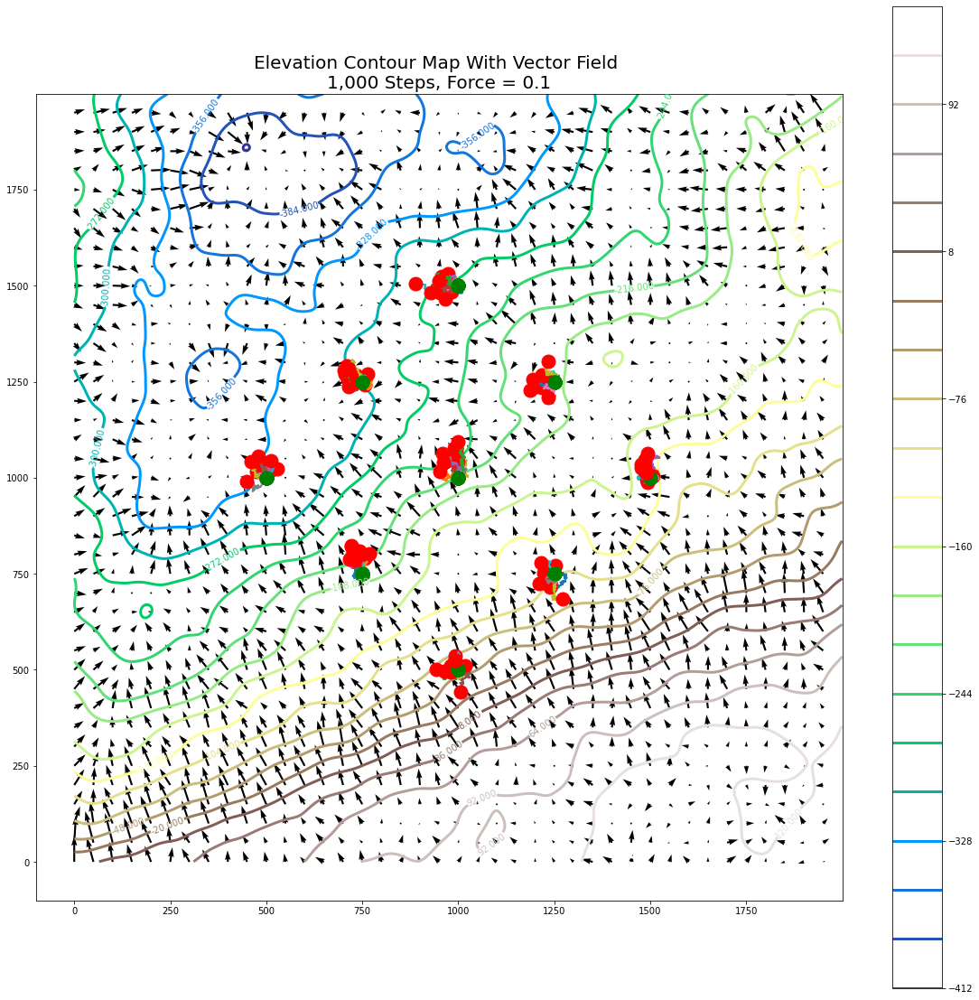

In [25]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

plt.title("Elevation Contour Map With Vector Field \n1,000 Steps, Force = 0.1", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = {}
list_points = {}
list_dist = []

all_walks1 = []

A = 1999
N = 1000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

for m in range(10):
    for walker in range(W):
        if walker == 0:
            x[0] = 1000
            y[0] = 1000
        elif walker == 1:
            x[0] = 1000
            y[0] = 1500
        elif walker == 2:
            x[0] = 1000
            y[0] = 500
        elif walker == 3:
            x[0] = 500
            y[0] = 1000
        elif walker == 4:
            x[0] = 1500
            y[0] = 1000
        elif walker == 5:
            x[0] = 1250
            y[0] = 1250
        elif walker == 6:
            x[0] = 1250
            y[0] = 750
        elif walker == 7:
            x[0] = 750
            y[0] = 1250
        else:
            x[0] = 750
            y[0] = 750
        for i in range(1, N):
            rand = randint(0, 3)
            if rand == 0:
                x[i] = x[i - 1] + 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            elif rand == 1:
                x[i] = x[i - 1] - 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            elif rand == 2:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] + 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            else:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] - 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)
    

        if walker in list_origins:
            list_origins[walker].append((x[0], y[0]))
        else:
            list_origins[walker] = [(x[0], y[0])]
            
        if walker in list_points:
            list_points[walker].append((x[-1], y[-1]))
        else:
            list_points[walker] = [(x[-1], y[-1])]
            
        all_walks1.append((x, y))
        plt.plot(x,y)
        plt.plot(x[0], y[0], 'go', markersize=15)
        plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.savefig('force_1000.png')
plt.show()

In [26]:
list_dist_1000 = {}

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        list_dist_1000[i] = []

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        d = math.dist(i, j)
        list_dist_1000[i].append(d)

In [27]:
avg_points_3 = []

for i in list_dist_1000:
    print("The max distance of origin ", i, " : " , max(list_dist_1000[i]))
    print("The min distance of origin ", i, " : " , min(list_dist_1000[i]))
    print("The median distance of origin ", i, " : " , statistics.median(list_dist_1000[i]))
    print("The average distance of origin ", i, " : " , mean(list_dist_1000[i]))
    avg_points[i].append(mean(list_dist_1000[i]))
    avg_points_3.append(mean(list_dist_1000[i]))
    print("\n")
    
avg_steps.append(mean(avg_points_3))

The max distance of origin  (1000.0, 1000.0)  :  92.68313880569637
The min distance of origin  (1000.0, 1000.0)  :  41.2565322195725
The median distance of origin  (1000.0, 1000.0)  :  55.78163028188954
The average distance of origin  (1000.0, 1000.0)  :  61.83191442461216


The max distance of origin  (1000.0, 1500.0)  :  111.02336438822708
The min distance of origin  (1000.0, 1500.0)  :  24.865731408964
The median distance of origin  (1000.0, 1500.0)  :  49.421824971907085
The average distance of origin  (1000.0, 1500.0)  :  50.26213754792794


The max distance of origin  (1000.0, 500.0)  :  58.44309537532857
The min distance of origin  (1000.0, 500.0)  :  17.37226005251879
The median distance of origin  (1000.0, 500.0)  :  24.506889398663187
The average distance of origin  (1000.0, 500.0)  :  31.610333089625094


The max distance of origin  (500.0, 1000.0)  :  59.17838822781527
The min distance of origin  (500.0, 1000.0)  :  12.040859980302882
The median distance of origin  (500.0, 

## 10,000 Steps, 9 Walkers, Force = 0.1

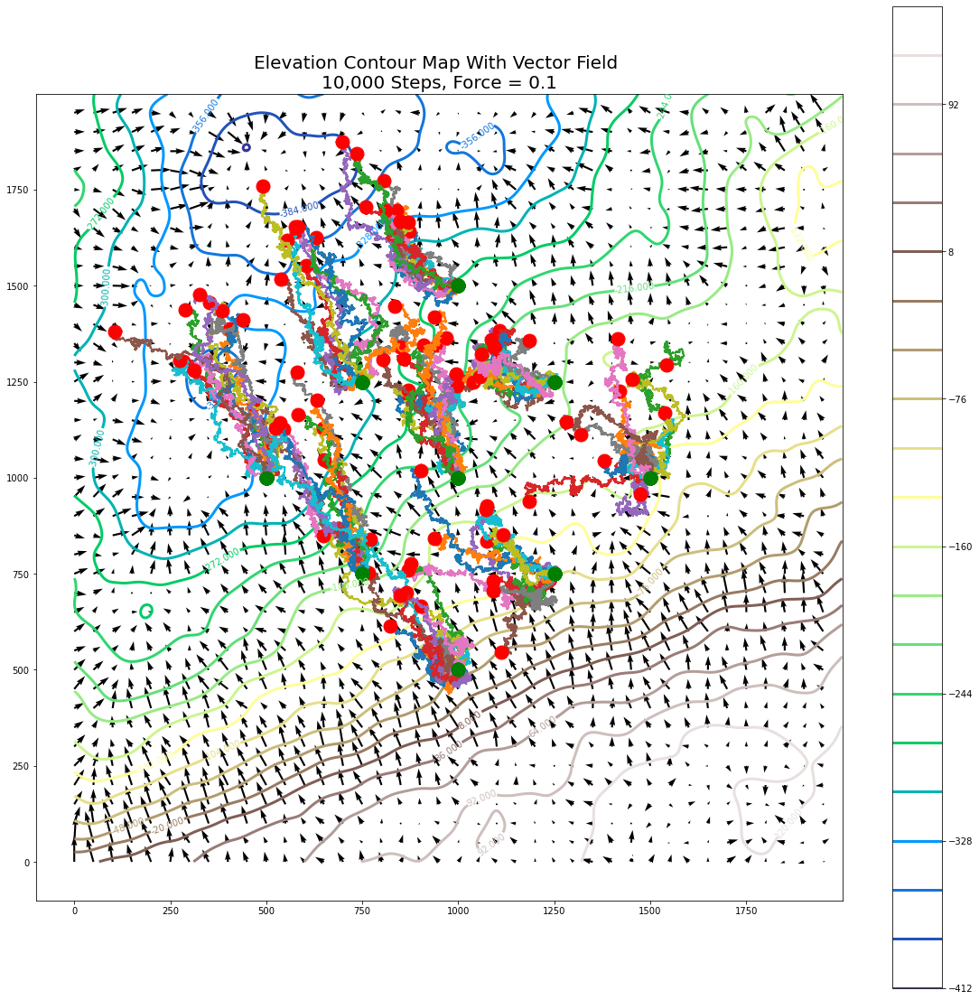

In [28]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

plt.title("Elevation Contour Map With Vector Field \n10,000 Steps, Force = 0.1", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = {}
list_points = {}
list_dist = []

all_walks1 = []

A = 1999
N = 10000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

for m in range(10):
    for walker in range(W):
        if walker == 0:
            x[0] = 1000
            y[0] = 1000
        elif walker == 1:
            x[0] = 1000
            y[0] = 1500
        elif walker == 2:
            x[0] = 1000
            y[0] = 500
        elif walker == 3:
            x[0] = 500
            y[0] = 1000
        elif walker == 4:
            x[0] = 1500
            y[0] = 1000
        elif walker == 5:
            x[0] = 1250
            y[0] = 1250
        elif walker == 6:
            x[0] = 1250
            y[0] = 750
        elif walker == 7:
            x[0] = 750
            y[0] = 1250
        else:
            x[0] = 750
            y[0] = 750
        for i in range(1, N):
            rand = randint(0, 3)
            if rand == 0:
                x[i] = x[i - 1] + 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            elif rand == 1:
                x[i] = x[i - 1] - 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            elif rand == 2:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] + 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)

            else:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] - 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.1)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.1)
    

        if walker in list_origins:
            list_origins[walker].append((x[0], y[0]))
        else:
            list_origins[walker] = [(x[0], y[0])]
            
        if walker in list_points:
            list_points[walker].append((x[-1], y[-1]))
        else:
            list_points[walker] = [(x[-1], y[-1])]
            
        all_walks1.append((x, y))
        plt.plot(x,y)
        plt.plot(x[0], y[0], 'go', markersize=15)
        plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.savefig('force_10000.png')
plt.show()

In [29]:
list_dist_10000 = {}

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        list_dist_10000[i] = []

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        d = math.dist(i, j)
        list_dist_10000[i].append(d)

In [30]:
avg_points_4 = []
for i in list_dist_10000:
    print("The max distance of origin ", i, " : " , max(list_dist_10000[i]))
    print("The min distance of origin ", i, " : " , min(list_dist_10000[i]))
    print("The median distance of origin ", i, " : " , statistics.median(list_dist_10000[i]))
    print("The average distance of origin ", i, " : " , mean(list_dist_10000[i]))
    avg_points[i].append(mean(list_dist_10000[i]))
    avg_points_4.append(mean(list_dist_10000[i]))
    print("\n")

avg_steps.append(mean(avg_points_4))

The max distance of origin  (1000.0, 1000.0)  :  423.1999338462074
The min distance of origin  (1000.0, 1000.0)  :  238.6722340505455
The median distance of origin  (1000.0, 1000.0)  :  344.91958700100747
The average distance of origin  (1000.0, 1000.0)  :  321.882305467645


The max distance of origin  (1000.0, 1500.0)  :  480.40681991851466
The min distance of origin  (1000.0, 1500.0)  :  189.8011076203222
The median distance of origin  (1000.0, 1500.0)  :  263.2251175369889
The average distance of origin  (1000.0, 1500.0)  :  292.60712874509693


The max distance of origin  (1000.0, 500.0)  :  495.4293667855362
The min distance of origin  (1000.0, 500.0)  :  72.63943413260877
The median distance of origin  (1000.0, 500.0)  :  243.6095712582141
The average distance of origin  (1000.0, 500.0)  :  258.9426966491209


The max distance of origin  (500.0, 1000.0)  :  548.1684126632618
The min distance of origin  (500.0, 1000.0)  :  337.9574655163029
The median distance of origin  (500.0, 

In [31]:
avg_steps

[2.9209533837891826, 10.050239870963484, 42.391134678156064, 311.3975984271116]

In [32]:
avg_dist = avg_steps.copy()

In [33]:
steps = [10, 100, 1000, 10000]


print(steps, "\n", avg_dist)

fig1 = px.scatter(x = steps, y = avg_dist, trendline="ols")
fig1.data[1].line.color = 'red'
fit_results = px.get_trendline_results(fig1).px_fit_results.iloc[0]
fig1.update_layout(title_text=("Average Distance vs. Number of Steps, \
<br>Force = 0.1 for 10, 100, 1000, 10000 Steps" + "<br>Slope = " + str(fit_results.params[1])))
fig1.write_image("forceplot_avg.png") 
fig1.show()

[10, 100, 1000, 10000] 
 [2.9209533837891826, 10.050239870963484, 42.391134678156064, 311.3975984271116]


In [34]:

print('Average Distance vs. Number of Steps, Force = 0.1 for 10, 100, 1000, 10000 Steps')
print("Slope :", fit_results.params[1])

Average Distance vs. Number of Steps, Force = 0.1 for 10, 100, 1000, 10000 Steps
Slope : 0.03048699068424205


In [35]:
d_x_log = np.log10(steps)
d_y_log = np.log10(avg_dist)

fig2 = px.scatter(x = d_x_log, y = d_y_log, trendline="ols")
fig2.data[1].line.color = 'red'
fit_results = px.get_trendline_results(fig2).px_fit_results.iloc[0]
fig2.update_layout(title_text=("LOG Average Distance vs. LOG Number of Steps, \
<br>Force = 0.1 for 10, 100, 1000, 10000 Steps" + "<br>Slope = " + str(fit_results.params[1])))
fig1.write_image("forceplot_avg.png") 
fig2.write_image("forceplot_avg_log.png") 
fig2.show()

In [36]:
fit_results = px.get_trendline_results(fig2).px_fit_results.iloc[0]
print('LOG Average Distance vs. LOG Number of Steps, Force = 0.1 for 10, 100, 1000, 10000 Steps')
print("Slope :", fit_results.params[1])

LOG Average Distance vs. LOG Number of Steps, Force = 0.1 for 10, 100, 1000, 10000 Steps
Slope : 0.6708470512696579


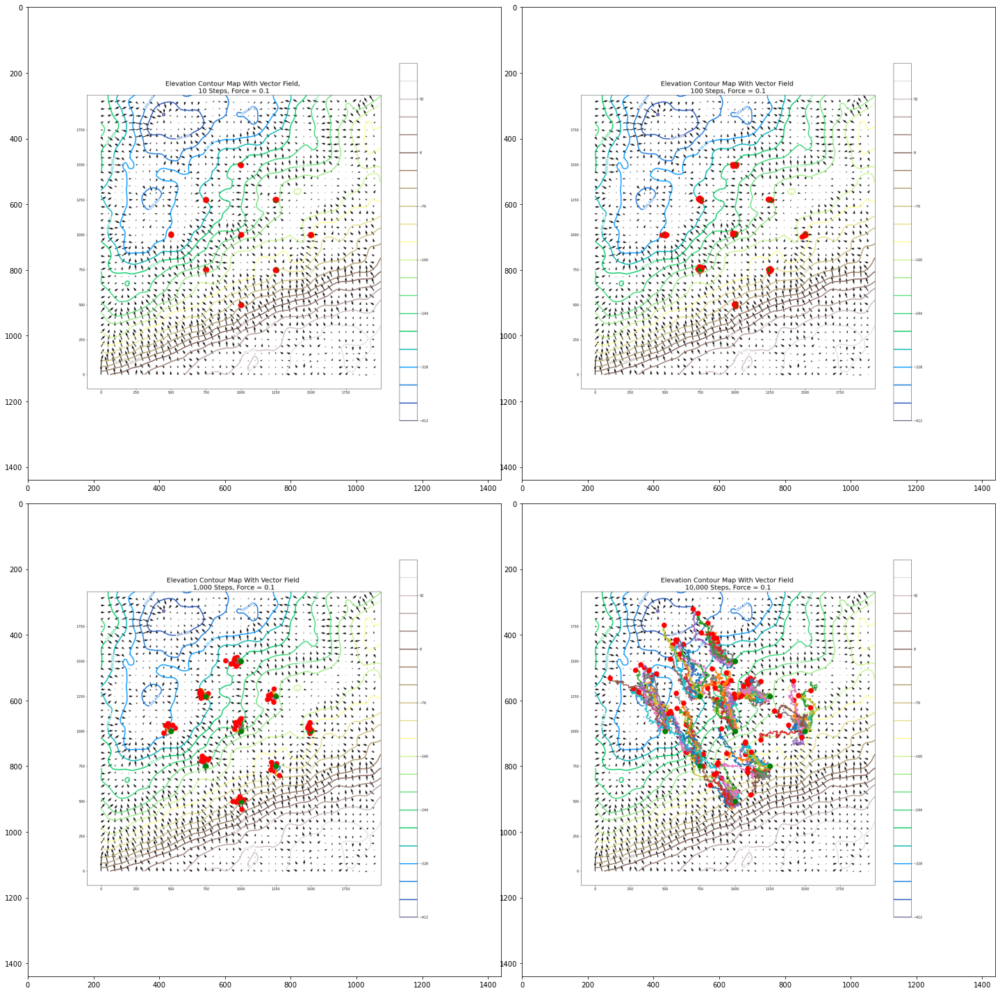

In [37]:
import cv2 as cv
from matplotlib import pyplot as plt

fig = plt.figure(figsize = (20, 20), facecolor='white')
force_10 = cv.imread('force_10.png')
force_10 = force_10[:,:, ::-1]
force_100 = cv.imread('force_100.png')
force_100 = force_100[:,:, ::-1]
force_1000 = cv.imread('force_1000.png')
force_1000 = force_1000[:,:, ::-1]
force_10000 = cv.imread('force_10000.png')
force_10000 = force_10000[:,:, ::-1]
plt.subplot(2, 2, 1), plt.imshow(force_10)
plt.subplot(2, 2, 2), plt.imshow(force_100)
plt.subplot(2, 2, 3), plt.imshow(force_1000)
plt.subplot(2, 2, 4), plt.imshow(force_10000)
plt.tight_layout()
plt.savefig('force_all.png', dpi=300) # To save figure
plt.show() # To show figure

# 10, 100, 1,000, 10,000 Steps, Force = 0

## 10 Steps, No Force

In [38]:
avg_steps_noforce = []

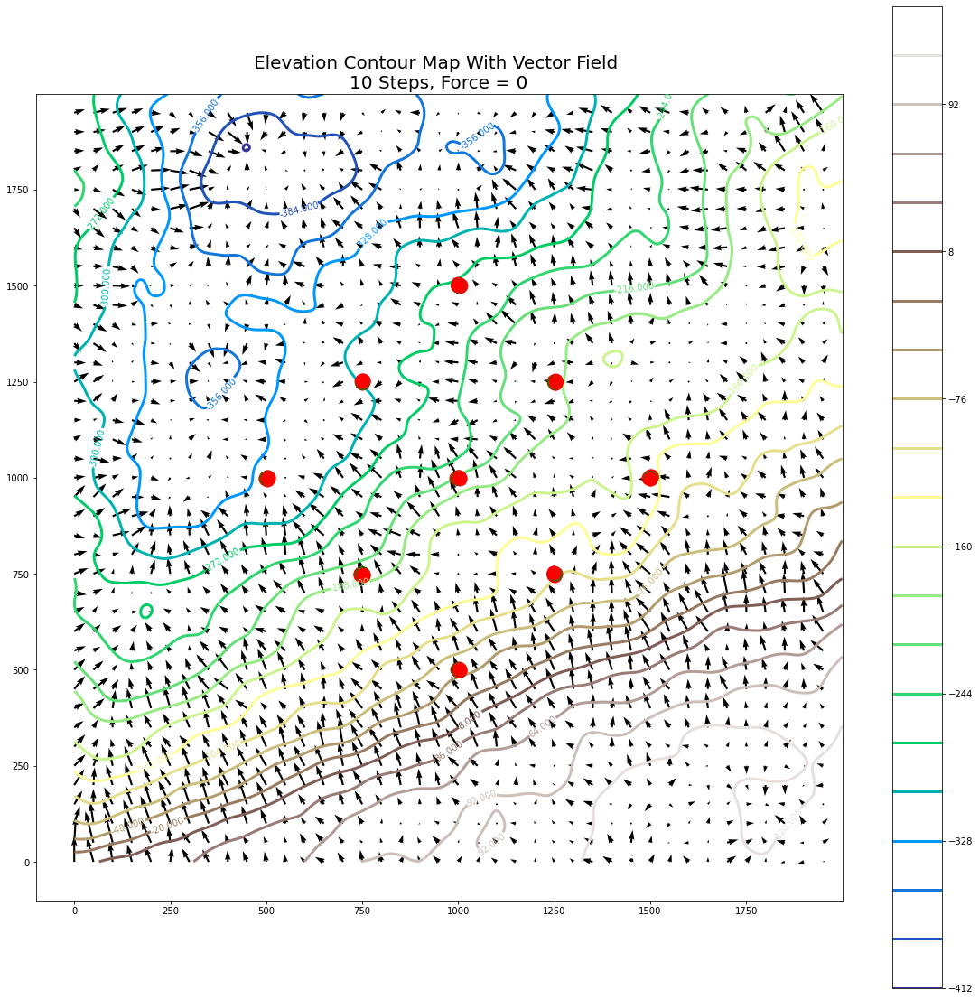

In [39]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

plt.title("Elevation Contour Map With Vector Field \n10 Steps, Force = 0", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = {}
list_points = {}
list_dist = []

all_walks1 = []

A = 1999
N = 10
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

for m in range(10):

    for walker in range(W):
        if walker == 0:
            x[0] = 1000
            y[0] = 1000
        elif walker == 1:
            x[0] = 1000
            y[0] = 1500
        elif walker == 2:
            x[0] = 1000
            y[0] = 500
        elif walker == 3:
            x[0] = 500
            y[0] = 1000
        elif walker == 4:
            x[0] = 1500
            y[0] = 1000
        elif walker == 5:
            x[0] = 1250
            y[0] = 1250
        elif walker == 6:
            x[0] = 1250
            y[0] = 750
        elif walker == 7:
            x[0] = 750
            y[0] = 1250
        else:
            x[0] = 750
            y[0] = 750
        for i in range(1, N):
            rand = randint(0, 3)
            if rand == 0:
                x[i] = x[i - 1] + 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            elif rand == 1:
                x[i] = x[i - 1] - 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            elif rand == 2:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] + 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            else:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] - 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)
    

        if walker in list_origins:
            list_origins[walker].append((x[0], y[0]))
        else:
            list_origins[walker] = [(x[0], y[0])]
            
        if walker in list_points:
            list_points[walker].append((x[-1], y[-1]))
        else:
            list_points[walker] = [(x[-1], y[-1])]
        
        all_walks1.append((x, y))
        plt.plot(x,y)
        plt.plot(x[0], y[0], 'go', markersize=15)
        plt.plot(x[-1], y[-1],'ro', markersize=15)
        
plt.savefig('noforce_10.png')        
plt.show()

In [40]:
list_dist_10 = {}

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        list_dist_10[i] = []

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        d = math.dist(i, j)
        list_dist_10[i].append(d)

In [41]:
avg_points_nf = {}

In [42]:
avg_points_nf1 = []

for i in list_dist_10:
    avg_points_nf[i] = []

for i in list_dist_10:
    print("The max distance of origin ", i, " : " , max(list_dist_10[i]))
    print("The min distance of origin ", i, " : " , min(list_dist_10[i]))
    print("The median distance of origin ", i, " : " , statistics.median(list_dist_10[i]))
    print("The average distance of origin ", i, " : " , mean(list_dist_10[i]))
    avg_points_nf[i].append(mean(list_dist_10[i]))
    avg_points_nf1.append(mean(list_dist_10[i]))
    print("\n")

avg_steps_noforce.append(mean(avg_points_nf1))

The max distance of origin  (1000.0, 1000.0)  :  5.0
The min distance of origin  (1000.0, 1000.0)  :  1.0
The median distance of origin  (1000.0, 1000.0)  :  1.618033988749895
The average distance of origin  (1000.0, 1000.0)  :  2.4964724878581444


The max distance of origin  (1000.0, 1500.0)  :  6.0827625302982185
The min distance of origin  (1000.0, 1500.0)  :  1.0
The median distance of origin  (1000.0, 1500.0)  :  3.6055512754639896
The average distance of origin  (1000.0, 1500.0)  :  3.2653038684343643


The max distance of origin  (1000.0, 500.0)  :  4.123105625617661
The min distance of origin  (1000.0, 500.0)  :  2.23606797749979
The median distance of origin  (1000.0, 500.0)  :  2.618033988749895
The average distance of origin  (1000.0, 500.0)  :  2.9637653689662247


The max distance of origin  (500.0, 1000.0)  :  5.0
The min distance of origin  (500.0, 1000.0)  :  1.0
The median distance of origin  (500.0, 1000.0)  :  2.618033988749895
The average distance of origin  (500.0

## 100 Steps, No Force

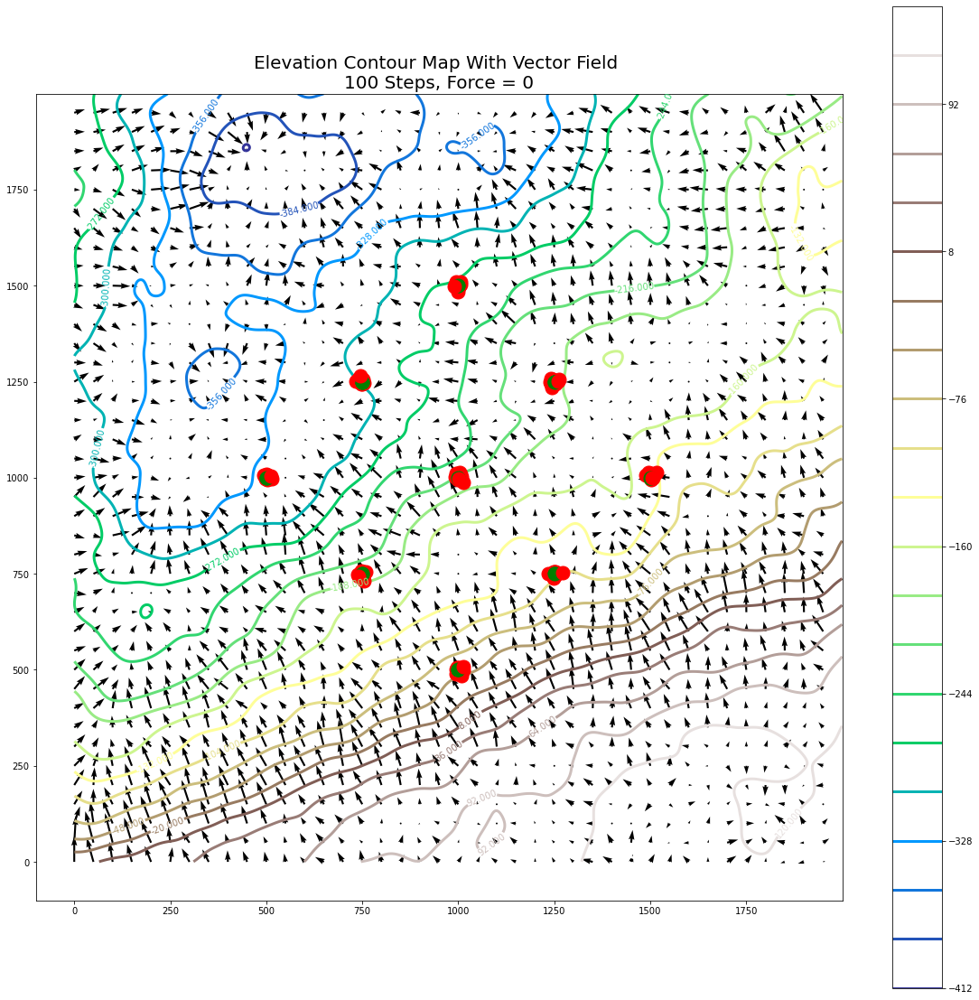

In [43]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

plt.title("Elevation Contour Map With Vector Field \n100 Steps, Force = 0", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = {}
list_points = {}
list_dist = []

all_walks1 = []

A = 1999
N = 100
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

for m in range(10):

    for walker in range(W):
        if walker == 0:
            x[0] = 1000
            y[0] = 1000
        elif walker == 1:
            x[0] = 1000
            y[0] = 1500
        elif walker == 2:
            x[0] = 1000
            y[0] = 500
        elif walker == 3:
            x[0] = 500
            y[0] = 1000
        elif walker == 4:
            x[0] = 1500
            y[0] = 1000
        elif walker == 5:
            x[0] = 1250
            y[0] = 1250
        elif walker == 6:
            x[0] = 1250
            y[0] = 750
        elif walker == 7:
            x[0] = 750
            y[0] = 1250
        else:
            x[0] = 750
            y[0] = 750
        for i in range(1, N):
            rand = randint(0, 3)
            if rand == 0:
                x[i] = x[i - 1] + 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            elif rand == 1:
                x[i] = x[i - 1] - 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            elif rand == 2:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] + 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            else:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] - 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)
    

        if walker in list_origins:
            list_origins[walker].append((x[0], y[0]))
        else:
            list_origins[walker] = [(x[0], y[0])]
            
        if walker in list_points:
            list_points[walker].append((x[-1], y[-1]))
        else:
            list_points[walker] = [(x[-1], y[-1])]
        
        all_walks1.append((x, y))
        plt.plot(x,y)
        plt.plot(x[0], y[0], 'go', markersize=15)
        plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.savefig('noforce_100.png')  
plt.show()

In [44]:
list_dist_100 = {}

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        list_dist_100[i] = []

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        d = math.dist(i, j)
        list_dist_100[i].append(d)

In [45]:
avg_points_nf2 = []
for i in list_dist_100:
    print("The max distance of origin ", i, " : " , max(list_dist_100[i]))
    print("The min distance of origin ", i, " : " , min(list_dist_100[i]))
    print("The median distance of origin ", i, " : " , statistics.median(list_dist_100[i]))
    print("The average distance of origin ", i, " : " , mean(list_dist_100[i]))
    avg_points_nf[i].append(mean(list_dist_100[i]))
    avg_points_nf2.append(mean(list_dist_100[i]))
    print("\n")

avg_steps_noforce.append(mean(avg_points_nf2))

The max distance of origin  (1000.0, 1000.0)  :  16.278820596099706
The min distance of origin  (1000.0, 1000.0)  :  2.23606797749979
The median distance of origin  (1000.0, 1000.0)  :  8.30313074680804
The average distance of origin  (1000.0, 1000.0)  :  8.643039058748526


The max distance of origin  (1000.0, 1500.0)  :  15.132745950421555
The min distance of origin  (1000.0, 1500.0)  :  4.123105625617661
The median distance of origin  (1000.0, 1500.0)  :  8.564483845538312
The average distance of origin  (1000.0, 1500.0)  :  8.629478380955726


The max distance of origin  (1000.0, 500.0)  :  17.0
The min distance of origin  (1000.0, 500.0)  :  2.23606797749979
The median distance of origin  (1000.0, 500.0)  :  8.071092532277987
The average distance of origin  (1000.0, 500.0)  :  8.684865328820832


The max distance of origin  (500.0, 1000.0)  :  15.132745950421555
The min distance of origin  (500.0, 1000.0)  :  3.6055512754639896
The median distance of origin  (500.0, 1000.0)  :  7.

## 1,000 Steps, No Force

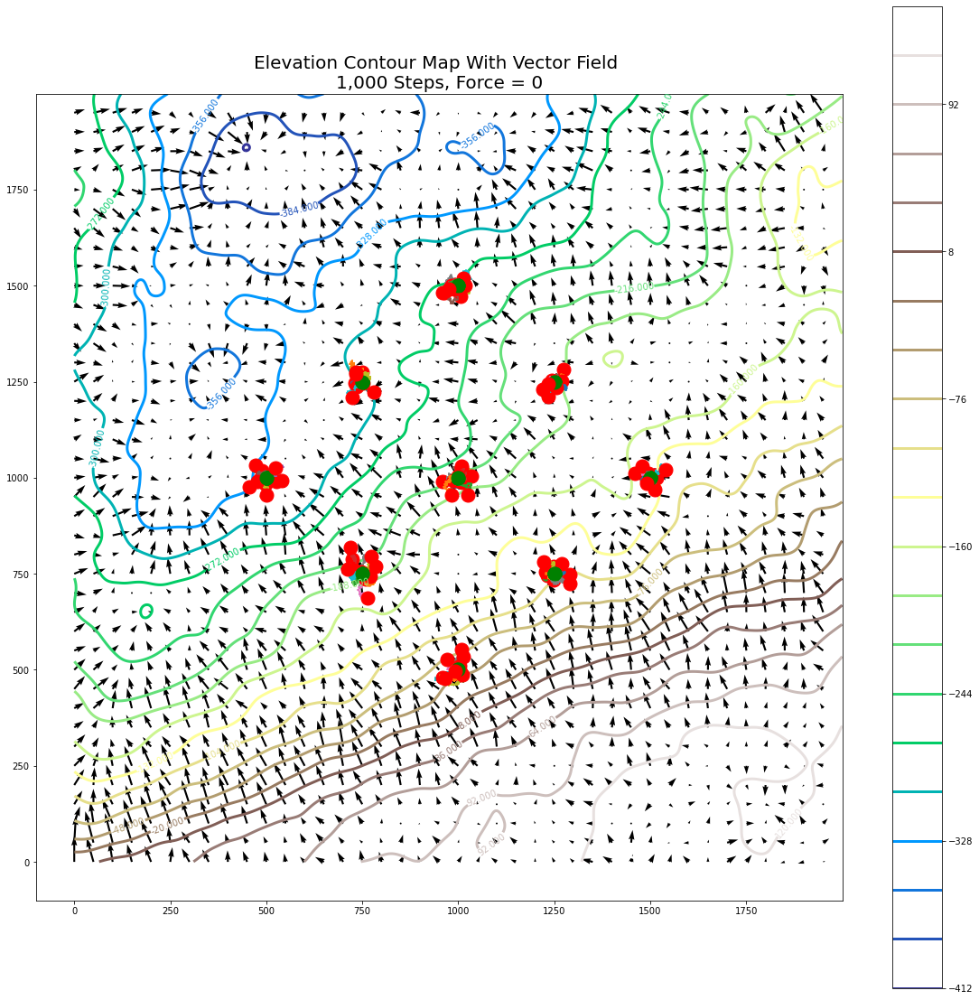

In [46]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

plt.title("Elevation Contour Map With Vector Field \n1,000 Steps, Force = 0", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = {}
list_points = {}
list_dist = []

all_walks1 = []

A = 1999
N = 1000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

for m in range(10):

    for walker in range(W):
        if walker == 0:
            x[0] = 1000
            y[0] = 1000
        elif walker == 1:
            x[0] = 1000
            y[0] = 1500
        elif walker == 2:
            x[0] = 1000
            y[0] = 500
        elif walker == 3:
            x[0] = 500
            y[0] = 1000
        elif walker == 4:
            x[0] = 1500
            y[0] = 1000
        elif walker == 5:
            x[0] = 1250
            y[0] = 1250
        elif walker == 6:
            x[0] = 1250
            y[0] = 750
        elif walker == 7:
            x[0] = 750
            y[0] = 1250
        else:
            x[0] = 750
            y[0] = 750
        for i in range(1, N):
            rand = randint(0, 3)
            if rand == 0:
                x[i] = x[i - 1] + 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            elif rand == 1:
                x[i] = x[i - 1] - 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            elif rand == 2:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] + 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            else:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] - 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)
    

        if walker in list_origins:
            list_origins[walker].append((x[0], y[0]))
        else:
            list_origins[walker] = [(x[0], y[0])]
            
        if walker in list_points:
            list_points[walker].append((x[-1], y[-1]))
        else:
            list_points[walker] = [(x[-1], y[-1])]
        
        all_walks1.append((x, y))
        plt.plot(x,y)
        plt.plot(x[0], y[0], 'go', markersize=15)
        plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.savefig('noforce_1000.png')  
plt.show()

In [47]:
list_dist_1000 = {}

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        list_dist_1000[i] = []

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        d = math.dist(i, j)
        list_dist_1000[i].append(d)

In [48]:
avg_points_nf3 = []
for i in list_dist_1000:
    print("The max distance of origin ", i, " : " , max(list_dist_1000[i]))
    print("The min distance of origin ", i, " : " , min(list_dist_1000[i]))
    print("The median distance of origin ", i, " : " , statistics.median(list_dist_1000[i]))
    print("The average distance of origin ", i, " : " , mean(list_dist_1000[i]))
    avg_points_nf[i].append(mean(list_dist_1000[i]))
    avg_points_nf3.append(mean(list_dist_1000[i]))
    print("\n")

avg_steps_noforce.append(mean(avg_points_nf3))

The max distance of origin  (1000.0, 1000.0)  :  50.60632371551998
The min distance of origin  (1000.0, 1000.0)  :  5.0
The median distance of origin  (1000.0, 1000.0)  :  29.41727625556343
The average distance of origin  (1000.0, 1000.0)  :  27.8450182889007


The max distance of origin  (1000.0, 1500.0)  :  46.09772228646444
The min distance of origin  (1000.0, 1500.0)  :  13.601470508735444
The median distance of origin  (1000.0, 1500.0)  :  20.426860441876563
The average distance of origin  (1000.0, 1500.0)  :  24.135479000462258


The max distance of origin  (1000.0, 500.0)  :  53.600373133029585
The min distance of origin  (1000.0, 500.0)  :  8.54400374531753
The median distance of origin  (1000.0, 500.0)  :  27.04868655839913
The average distance of origin  (1000.0, 500.0)  :  27.56227299278737


The max distance of origin  (500.0, 1000.0)  :  50.60632371551998
The min distance of origin  (500.0, 1000.0)  :  17.11724276862369
The median distance of origin  (500.0, 1000.0)  :  31

## 10,000 Steps, No Force

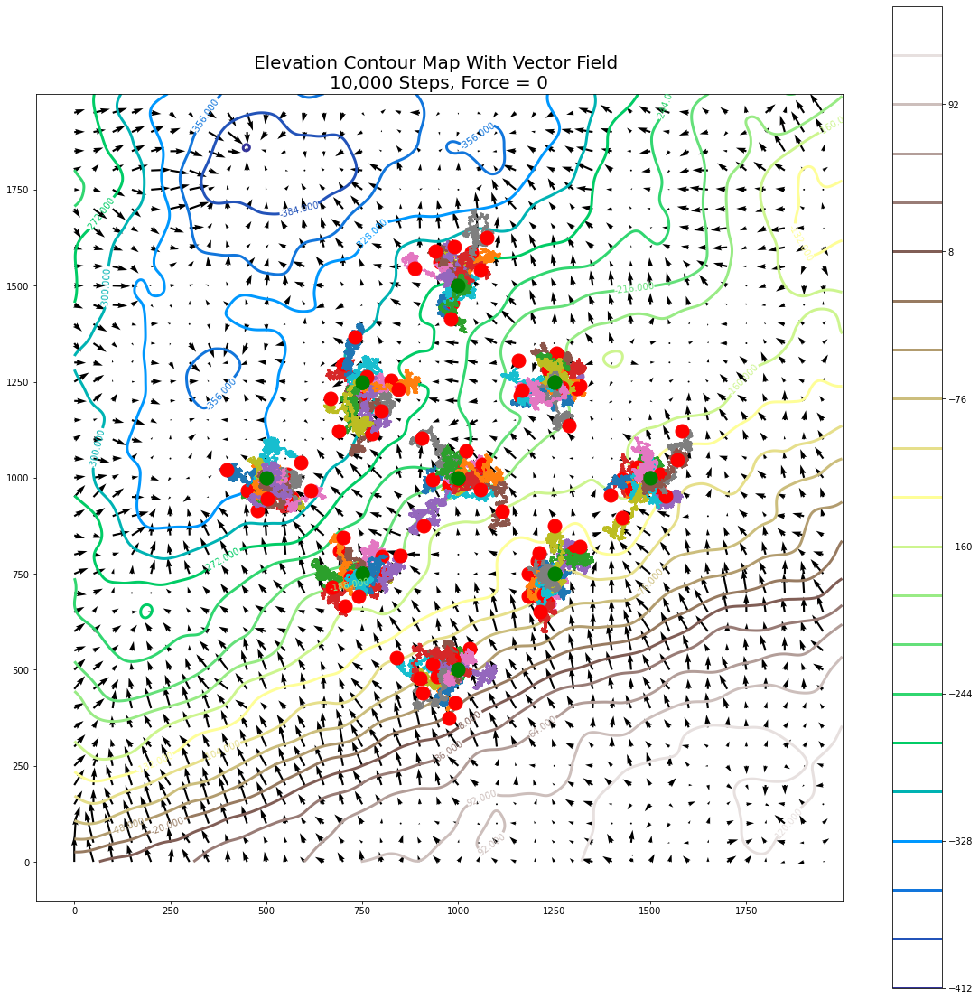

In [49]:
x = np.arange(0,2000,1)
y = np.arange(0,2000,1)

X, Y = np.meshgrid(x, y)

# Negative Z: Arrows Point From Higher to Lower Elevation
# Positive Z: Arrows Point From Lower to Higher Elevation
#dy, dx Initialize Order
dx, dy = np.gradient(-Z)

fig = plt.figure(figsize = (20, 20), facecolor='white')
ax = fig.add_subplot(111)

ecm = plt.contour(Z, cmap = "terrain", 
            levels = list(range(a, b, c)), linewidths=3, origin='lower')
ax.clabel(ecm, fontsize=10)


#Use Quiver to Create Vector Field
#Input Order dy, dx
step=50

ax.quiver(X[::step,::step], Y[::step,::step], dy[::step,::step], dx[::step,::step])

plt.title("Elevation Contour Map With Vector Field \n10,000 Steps, Force = 0", fontsize=20)
cbar = plt.colorbar()
plt.gca().set_aspect('equal', adjustable='box')

avg_2D = []

list_origins = {}
list_points = {}
list_dist = []

all_walks1 = []

A = 1999
N = 10000
W = 9

x = np.zeros(N)
y = np.zeros(N)
z = np.zeros(N)

origin = (0, 0)
tx = 0
ty = 0

for m in range(10):

    for walker in range(W):
        if walker == 0:
            x[0] = 1000
            y[0] = 1000
        elif walker == 1:
            x[0] = 1000
            y[0] = 1500
        elif walker == 2:
            x[0] = 1000
            y[0] = 500
        elif walker == 3:
            x[0] = 500
            y[0] = 1000
        elif walker == 4:
            x[0] = 1500
            y[0] = 1000
        elif walker == 5:
            x[0] = 1250
            y[0] = 1250
        elif walker == 6:
            x[0] = 1250
            y[0] = 750
        elif walker == 7:
            x[0] = 750
            y[0] = 1250
        else:
            x[0] = 750
            y[0] = 750
        for i in range(1, N):
            rand = randint(0, 3)
            if rand == 0:
                x[i] = x[i - 1] + 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            elif rand == 1:
                x[i] = x[i - 1] - 1
                y[i] = y[i - 1]
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            elif rand == 2:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] + 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)

            else:
                x[i] = x[i - 1] 
                y[i] = y[i - 1] - 1
                x[i] = x[i] + force_mov(x[i], y[i], dy, 0.0)
                y[i] = y[i] + force_mov(x[i], y[i], dx, 0.0)
    

        if walker in list_origins:
            list_origins[walker].append((x[0], y[0]))
        else:
            list_origins[walker] = [(x[0], y[0])]
            
        if walker in list_points:
            list_points[walker].append((x[-1], y[-1]))
        else:
            list_points[walker] = [(x[-1], y[-1])]
        
        all_walks1.append((x, y))
        plt.plot(x,y)
        plt.plot(x[0], y[0], 'go', markersize=15)
        plt.plot(x[-1], y[-1],'ro', markersize=15)

plt.savefig('noforce_10000.png')
plt.show()

In [50]:
list_dist_10000 = {}

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        list_dist_10000[i] = []

for value1, value2 in zip(list_origins.values(), list_points.values()):
    for i, j in zip(value1, value2):
        d = math.dist(i, j)
        list_dist_10000[i].append(d)

In [51]:
avg_points_nf4 = []
for i in list_dist_10000:
    print("The max distance of origin ", i, " : " , max(list_dist_10000[i]))
    print("The min distance of origin ", i, " : " , min(list_dist_10000[i]))
    print("The median distance of origin ", i, " : " , statistics.median(list_dist_10000[i]))
    print("The average distance of origin ", i, " : " , mean(list_dist_10000[i]))
    avg_points_nf[i].append(mean(list_dist_10000[i]))
    avg_points_nf4.append(mean(list_dist_10000[i]))
    print("\n")

avg_steps_noforce.append(mean(avg_points_nf4))

The max distance of origin  (1000.0, 1000.0)  :  154.02921800749365
The min distance of origin  (1000.0, 1000.0)  :  6.0827625302982185
The median distance of origin  (1000.0, 1000.0)  :  69.69024289011669
The average distance of origin  (1000.0, 1000.0)  :  80.62946938468427


The max distance of origin  (1000.0, 1500.0)  :  146.63219291819922
The min distance of origin  (1000.0, 1500.0)  :  46.486557196677836
The median distance of origin  (1000.0, 1500.0)  :  91.33848204361713
The average distance of origin  (1000.0, 1500.0)  :  93.83772859286339


The max distance of origin  (1000.0, 500.0)  :  162.97545827516487
The min distance of origin  (1000.0, 500.0)  :  29.068883707497267
The median distance of origin  (1000.0, 500.0)  :  78.0522046441225
The average distance of origin  (1000.0, 500.0)  :  85.51247675460726


The max distance of origin  (500.0, 1000.0)  :  119.9208072020865
The min distance of origin  (500.0, 1000.0)  :  55.036351623268054
The median distance of origin  (500

In [52]:
avg_dist_noforce = avg_steps_noforce.copy()

In [53]:
steps = [10, 100, 1000, 10000]


print(steps, "\n", avg_dist_noforce)

fig3 = px.scatter(x = steps, y = avg_dist_noforce, trendline="ols")
fig3.data[1].line.color = 'red'
fit_results = px.get_trendline_results(fig3).px_fit_results.iloc[0]
fig3.update_layout(title_text=("Average Distance vs. Number of Steps, \
<br>Force = 0 for 10, 100, 1000, 10000 Steps" + "<br>Slope = " + str(fit_results.params[1])))
fig3.write_image("noforceplot_avg.png") 
fig3.show()

[10, 100, 1000, 10000] 
 [2.925543608613787, 8.93580403236988, 27.124148948202325, 81.30207739855729]


In [54]:
fit_results = px.get_trendline_results(fig3).px_fit_results.iloc[0]
print('LOG Average Distance vs. LOG Number of Steps, Force = 0 for 10, 100, 1000, 10000 Steps')
print("Slope :", fit_results.params[1])

LOG Average Distance vs. LOG Number of Steps, Force = 0 for 10, 100, 1000, 10000 Steps
Slope : 0.007226714562928343


In [55]:
d_x_log = np.log10(steps)
d_y_log = np.log10(avg_dist_noforce)

fig4 = px.scatter(x = d_x_log, y = d_y_log, trendline="ols")
fig4.data[1].line.color = 'red'
fit_results = px.get_trendline_results(fig4).px_fit_results.iloc[0]
fig4.update_layout(title_text=("LOG Average Distance vs. LOG Number of Steps, \
<br>Force = 0 for 10, 100, 1000, 10000 Steps" + "<br>Slope = " + str(fit_results.params[1])))
fig4.write_image("noforceplot_avg_log.png") 
fig4.show()

In [56]:
fit_results = px.get_trendline_results(fig4).px_fit_results.iloc[0]
print('LOG Average Distance vs. LOG Number of Steps, Force = 0 for 10, 100, 1000, 10000 Steps')
print("Slope :", fit_results.params[1])

LOG Average Distance vs. LOG Number of Steps, Force = 0 for 10, 100, 1000, 10000 Steps
Slope : 0.4813907684205135


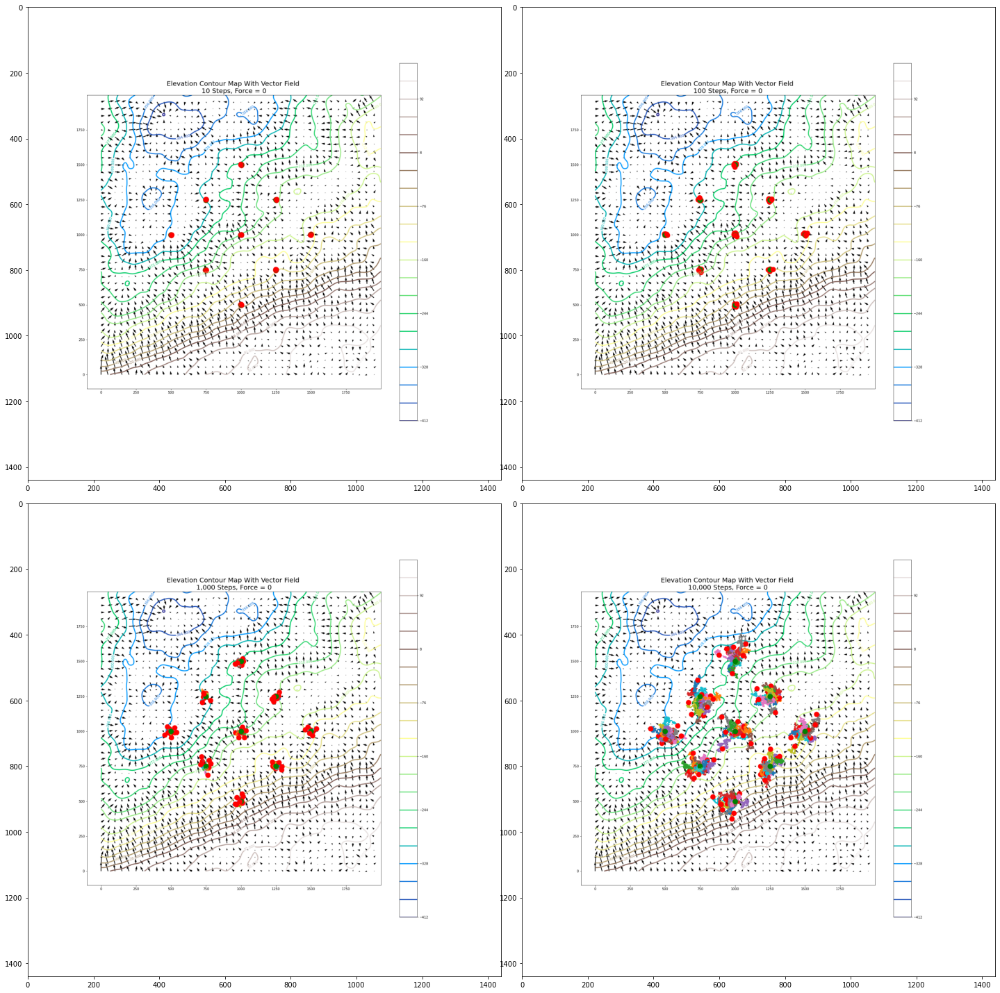

In [57]:
import cv2 as cv
from matplotlib import pyplot as plt

fig = plt.figure(figsize = (20, 20), facecolor='white')
noforce_10 = cv.imread('noforce_10.png')
noforce_10 = noforce_10[:,:, ::-1]
noforce_100 = cv.imread('noforce_100.png')
noforce_100 = noforce_100[:,:, ::-1]
noforce_1000 = cv.imread('noforce_1000.png')
noforce_1000 = noforce_1000[:,:, ::-1]
noforce_10000 = cv.imread('noforce_10000.png')
noforce_10000 = noforce_10000[:,:, ::-1]
plt.subplot(2, 2, 1), plt.imshow(noforce_10)
plt.subplot(2, 2, 2), plt.imshow(noforce_100)
plt.subplot(2, 2, 3), plt.imshow(noforce_1000)
plt.subplot(2, 2, 4), plt.imshow(noforce_10000)
plt.tight_layout()
plt.savefig('noforce_all.png', dpi=300) # To save figure
plt.show() # To show figure

In [58]:
print(avg_points_1, avg_points_2, avg_points_3, avg_points_4)

[2.2792597948509377, 2.4791019876230562, 2.7765736274115773, 3.12023006775466, 2.976578743831319, 3.1584311639273284, 3.760796814795751, 2.8433780624255047, 2.894230191482505] [11.546217550126196, 11.215903031801151, 6.971681063103452, 9.042229057003269, 9.435822243174176, 7.927908953839496, 9.456088382664564, 9.369965850341439, 15.486342706617602] [61.83191442461216, 50.26213754792794, 31.610333089625094, 41.900404305823166, 29.189794013981363, 40.805574127952625, 35.27666636900129, 36.347076721204864, 54.29631150327604] [321.882305467645, 292.60712874509693, 258.9426966491209, 437.6267195003091, 231.36325383588138, 189.22557687492264, 257.6158264723524, 371.2279523664522, 442.0869259322235]


In [59]:
print(avg_points_nf1, avg_points_nf2, avg_points_nf3, avg_points_nf4)

[2.4964724878581444, 3.2653038684343643, 2.9637653689662247, 3.067292881108081, 3.2559966459198675, 2.979603443669847, 2.815537446092714, 2.3436860833581017, 3.1422342521167415] [8.643039058748526, 8.629478380955726, 8.684865328820832, 8.043994965973251, 10.046471344849316, 9.329990061687603, 9.23332559403873, 8.828144994633604, 8.982926561621342] [27.8450182889007, 24.135479000462258, 27.56227299278737, 32.090770241965615, 23.154373587773534, 20.234238746443836, 27.30656308890375, 23.882103794346147, 37.906520792237714] [80.62946938468427, 93.83772859286339, 85.51247675460726, 82.92156809800865, 76.84572329486927, 70.94684582385216, 82.04195069778078, 87.36912002678702, 71.61381391356295]


In [60]:
avg_points

{(1000.0, 1000.0): [2.2792597948509377,
  11.546217550126196,
  61.83191442461216,
  321.882305467645],
 (1000.0, 1500.0): [2.4791019876230562,
  11.215903031801151,
  50.26213754792794,
  292.60712874509693],
 (1000.0, 500.0): [2.7765736274115773,
  6.971681063103452,
  31.610333089625094,
  258.9426966491209],
 (500.0, 1000.0): [3.12023006775466,
  9.042229057003269,
  41.900404305823166,
  437.6267195003091],
 (1500.0, 1000.0): [2.976578743831319,
  9.435822243174176,
  29.189794013981363,
  231.36325383588138],
 (1250.0, 1250.0): [3.1584311639273284,
  7.927908953839496,
  40.805574127952625,
  189.22557687492264],
 (1250.0, 750.0): [3.760796814795751,
  9.456088382664564,
  35.27666636900129,
  257.6158264723524],
 (750.0, 1250.0): [2.8433780624255047,
  9.369965850341439,
  36.347076721204864,
  371.2279523664522],
 (750.0, 750.0): [2.894230191482505,
  15.486342706617602,
  54.29631150327604,
  442.0869259322235]}

In [61]:
avg_points_nf

{(1000.0, 1000.0): [2.4964724878581444,
  8.643039058748526,
  27.8450182889007,
  80.62946938468427],
 (1000.0, 1500.0): [3.2653038684343643,
  8.629478380955726,
  24.135479000462258,
  93.83772859286339],
 (1000.0, 500.0): [2.9637653689662247,
  8.684865328820832,
  27.56227299278737,
  85.51247675460726],
 (500.0, 1000.0): [3.067292881108081,
  8.043994965973251,
  32.090770241965615,
  82.92156809800865],
 (1500.0, 1000.0): [3.2559966459198675,
  10.046471344849316,
  23.154373587773534,
  76.84572329486927],
 (1250.0, 1250.0): [2.979603443669847,
  9.329990061687603,
  20.234238746443836,
  70.94684582385216],
 (1250.0, 750.0): [2.815537446092714,
  9.23332559403873,
  27.30656308890375,
  82.04195069778078],
 (750.0, 1250.0): [2.3436860833581017,
  8.828144994633604,
  23.882103794346147,
  87.36912002678702],
 (750.0, 750.0): [3.1422342521167415,
  8.982926561621342,
  37.906520792237714,
  71.61381391356295]}

In [62]:
for i in avg_points.values():
    print(i)

[2.2792597948509377, 11.546217550126196, 61.83191442461216, 321.882305467645]
[2.4791019876230562, 11.215903031801151, 50.26213754792794, 292.60712874509693]
[2.7765736274115773, 6.971681063103452, 31.610333089625094, 258.9426966491209]
[3.12023006775466, 9.042229057003269, 41.900404305823166, 437.6267195003091]
[2.976578743831319, 9.435822243174176, 29.189794013981363, 231.36325383588138]
[3.1584311639273284, 7.927908953839496, 40.805574127952625, 189.22557687492264]
[3.760796814795751, 9.456088382664564, 35.27666636900129, 257.6158264723524]
[2.8433780624255047, 9.369965850341439, 36.347076721204864, 371.2279523664522]
[2.894230191482505, 15.486342706617602, 54.29631150327604, 442.0869259322235]


In [63]:
for i, j in avg_points.items():
    m, b = np.polyfit(steps, j, 1)
    print(i, " Slope: ", m)

(1000.0, 1000.0)  Slope:  0.031042073586242534
(1000.0, 1500.0)  Slope:  0.028325926820434416
(1000.0, 500.0)  Slope:  0.02548285871688252
(500.0, 1000.0)  Slope:  0.043525942859491254
(1500.0, 1000.0)  Slope:  0.022602811766297005
(1250.0, 1250.0)  Slope:  0.018020591500630866
(1250.0, 750.0)  Slope:  0.025119703877556493
(750.0, 1250.0)  Slope:  0.03682898652310295
(750.0, 750.0)  Slope:  0.04343402050754043


In [64]:
steps

[10, 100, 1000, 10000]

In [65]:
df = pd.DataFrame()
df1 = pd.DataFrame()
df['Points'] =  avg_points.keys()
df['Distance'] = avg_points.values()
df = df.explode('Distance')
df1['Steps'] = [steps for i in avg_points.keys()]
df1 = df1.explode('Steps')
df['Steps'] = df1['Steps']

In [66]:
df_nf = pd.DataFrame()
df1 = pd.DataFrame()
df_nf['Points'] =  avg_points_nf.keys()
df_nf['Distance'] = avg_points_nf.values()
df_nf = df_nf.explode('Distance')
df1['Steps'] = [steps for i in avg_points_nf.keys()]
df1 = df1.explode('Steps')
df_nf['Steps'] = df1['Steps']

In [67]:
df_log = df.copy()
df_nf_log = df_nf.copy()

In [68]:
df_log['Distance'] = [np.log10(i) for i in df['Distance']]
df_log['Steps'] = [np.log10(i) for i in df['Steps']]
df_nf_log['Distance'] = [np.log10(i) for i in df_nf['Distance']]
df_nf_log['Steps'] = [np.log10(i) for i in df_nf['Steps']]

In [69]:
df.head(), df_log.head(), df_nf.head(), df_nf_log.head()

(             Points Distance  Steps
 0  (1000.0, 1000.0)  2.27926     10
 0  (1000.0, 1000.0)  11.5462    100
 0  (1000.0, 1000.0)  61.8319   1000
 0  (1000.0, 1000.0)  321.882  10000
 1  (1000.0, 1500.0)   2.4791     10,
              Points  Distance  Steps
 0  (1000.0, 1000.0)  0.357794    1.0
 0  (1000.0, 1000.0)  1.062440    2.0
 0  (1000.0, 1000.0)  1.791213    3.0
 0  (1000.0, 1000.0)  2.507697    4.0
 1  (1000.0, 1500.0)  0.394294    1.0,
              Points Distance  Steps
 0  (1000.0, 1000.0)  2.49647     10
 0  (1000.0, 1000.0)  8.64304    100
 0  (1000.0, 1000.0)   27.845   1000
 0  (1000.0, 1000.0)  80.6295  10000
 1  (1000.0, 1500.0)   3.2653     10,
              Points  Distance  Steps
 0  (1000.0, 1000.0)  0.397327    1.0
 0  (1000.0, 1000.0)  0.936666    2.0
 0  (1000.0, 1000.0)  1.444748    3.0
 0  (1000.0, 1000.0)  1.906494    4.0
 1  (1000.0, 1500.0)  0.513924    1.0)

In [70]:
fig5 = px.scatter(df, x='Steps', y='Distance', facet_col='Points', facet_col_wrap=3, trendline="ols",
                 trendline_color_override="red")
fig5.data[0].line.color = 'red'
fit_results = px.get_trendline_results(fig2).px_fit_results.iloc[0]
fig5.update_layout(title_text="Average Distance vs. Number of Steps, Force = 0.1 for Each Point", height=700)
fig5.write_image("forceplot_allpoints.png") 
fig5.show()

In [71]:
fit_results = px.get_trendline_results(fig5).px_fit_results.iloc[0]
print('LOG Average Distance vs. LOG Number of Steps, Force = 0 for 10, 100, 1000, 10000 Steps')
print("Slope :", fit_results.params[1])

LOG Average Distance vs. LOG Number of Steps, Force = 0 for 10, 100, 1000, 10000 Steps
Slope : 0.031042073586242537


In [72]:
print("Average Distance vs. Number of Steps Force = 0.1")
print("Points: \t\t\t Slope")
for i, j in avg_points.items():
    m, b = np.polyfit(steps, j, 1)
    print(i, " \t\t", m)

Average Distance vs. Number of Steps Force = 0.1
Points: 			 Slope
(1000.0, 1000.0)  		 0.031042073586242534
(1000.0, 1500.0)  		 0.028325926820434416
(1000.0, 500.0)  		 0.02548285871688252
(500.0, 1000.0)  		 0.043525942859491254
(1500.0, 1000.0)  		 0.022602811766297005
(1250.0, 1250.0)  		 0.018020591500630866
(1250.0, 750.0)  		 0.025119703877556493
(750.0, 1250.0)  		 0.03682898652310295
(750.0, 750.0)  		 0.04343402050754043


In [73]:
fig6 = px.scatter(df_log, x='Steps', y='Distance', facet_col='Points', facet_col_wrap=3, trendline="ols",
                 trendline_color_override="red")
fig6.data[0].line.color = 'red'
fig6.update_layout(title_text="LOG Average Distance vs. LOG Number of Steps, Force = 0.1 for Each Point", height=700)
fig6.write_image("forceplot_allpoints_log.png") 
fig6.show()

In [74]:
print("Average Distance vs. Number of Steps Force = 0.1")
print("Points: \t\t\t Slope")
for i, j in avg_points.items():
    m, b = np.polyfit(np.log10(steps), np.log10(j), 1)
    print(i, " \t\t", m)

Average Distance vs. Number of Steps Force = 0.1
Points: 			 Slope
(1000.0, 1000.0)  		 0.7178482777576939
(1000.0, 1500.0)  		 0.6867378235487764
(1000.0, 500.0)  		 0.6565574977650822
(500.0, 1000.0)  		 0.7106694347085324
(1500.0, 1000.0)  		 0.6162182301633472
(1250.0, 1250.0)  		 0.6044086103996913
(1250.0, 750.0)  		 0.6078854024304542
(750.0, 1250.0)  		 0.6936149664099726
(750.0, 750.0)  		 0.7096745267613704


In [75]:
fig7 = px.scatter(df_nf, x='Steps', y='Distance', facet_col='Points', facet_col_wrap=3, trendline="ols",
                 trendline_color_override="red")
fig7.data[0].line.color = 'red'
fig7.update_layout(title_text="Average Distance vs. Number of Steps, Force = 0 for Each Point", height=700)
fig7.write_image("noforceplot_allpoints.png") 
fig7.show()

In [76]:
print("Average Distance vs. Number of Steps Force = 0")
print("Points: \t\t\t Slope")
for i, j in avg_points_nf.items():
    m, b = np.polyfit(steps, j, 1)
    print(i, " \t\t", m)

Average Distance vs. Number of Steps Force = 0
Points: 			 Slope
(1000.0, 1000.0)  		 0.00716730186430572
(1000.0, 1500.0)  		 0.008591335666375271
(1000.0, 500.0)  		 0.007657164460765268
(500.0, 1000.0)  		 0.007296051498304414
(1500.0, 1000.0)  		 0.0068130691743830615
(1250.0, 1250.0)  		 0.006317990361232271
(1250.0, 750.0)  		 0.007291250385168151
(750.0, 1250.0)  		 0.007960555984127255
(750.0, 750.0)  		 0.005945711671693698


In [77]:
fig8 = px.scatter(df_nf_log, x='Steps', y='Distance', facet_col='Points', facet_col_wrap=3, trendline="ols",
                 trendline_color_override="red")
fig8.data[0].line.color = 'red'
fig8.update_layout(title_text="LOG Average Distance vs. LOG Number of Steps, Force = 0 for Each Point", height=700)
fig8.write_image("noforceplot_allpoints_log.png") 
fig8.show()

In [78]:
print("Average Distance vs. Number of Steps Force = 0")
print("Points: \t\t\t Slope")
for i, j in avg_points_nf.items():
    m, b = np.polyfit(np.log10(steps), np.log10(j), 1)
    print(i, " \t\t", m)

Average Distance vs. Number of Steps Force = 0
Points: 			 Slope
(1000.0, 1000.0)  		 0.5035582084170641
(1000.0, 1500.0)  		 0.48220330293208513
(1000.0, 500.0)  		 0.48821089403166995
(500.0, 1000.0)  		 0.4896645129849156
(1500.0, 1000.0)  		 0.4481426747802538
(1250.0, 1250.0)  		 0.446652956292307
(1250.0, 750.0)  		 0.4864332901910637
(750.0, 1250.0)  		 0.5146578685066623
(750.0, 750.0)  		 0.4698570810998092
